In [171]:
# import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from datetime import datetime
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from datetime import datetime

In [172]:
df = pd.read_csv('/content/match_events_for_test.csv')

In [173]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3748 entries, 0 to 3747
Data columns (total 70 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           3748 non-null   int64  
 1   db_match_id                  3748 non-null   int64  
 2   sb_id                        3748 non-null   object 
 3   sb_index                     3748 non-null   int64  
 4   period                       3748 non-null   int64  
 5   timestamp                    3748 non-null   object 
 6   minute                       3748 non-null   int64  
 7   second                       3748 non-null   int64  
 8   possession                   3748 non-null   int64  
 9   obv_for_after                2088 non-null   float64
 10  obv_for_before               2100 non-null   float64
 11  obv_for_net                  2088 non-null   float64
 12  obv_against_after            2088 non-null   float64
 13  obv_against_before

In [174]:
df.describe()

,id,db_match_id,sb_index,period,minute,second,possession,obv_for_after,obv_for_before,obv_for_net,...,dist_to_keeper,angle_to_goal,angle_to_keeper,angle_deviation,avevelocity,time_in_poss,goal,total_score,home_team_id,away_team_id
count,3.748000e+03,3748.0,3748.000000,3748.000000,3748.000000,3748.000000,3748.000000,2088.000000,2100.000000,2088.000000,...,19.000000,19.000000,19.000000,19.000000,19.000000,3748.000000,3748.000000,3748.000000,3748.0,3748.0
mean,3.459573e+08,97823.0,1874.500000,1.506937,46.322839,29.912753,94.586446,0.018845,0.017566,0.001259,...,4.132958,81.053849,80.500330,11.703859,18.804690,16.763171,0.001067,1.957044,17.0,89.0
std,6.075192e+03,0.0,1082.098732,0.500019,27.577551,17.361695,51.818186,0.028726,0.013378,0.024642,...,2.222418,29.262666,37.210666,7.904390,5.576853,16.817343,0.032655,1.330002,0.0,0.0
min,3.459467e+08,97823.0,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.003646,-0.187409,...,1.581139,40.333141,29.357754,1.909770,8.155851,0.000000,0.000000,0.000000,17.0,89.0
25%,3.459519e+08,97823.0,937.750000,1.000000,22.000000,15.000000,49.750000,0.011105,0.010896,-0.001198,...,3.309490,60.964802,52.328375,4.678362,16.645503,4.107000,0.000000,1.000000,17.0,89.0
50%,3.459575e+08,97823.0,1874.500000,2.000000,46.000000,30.000000,100.000000,0.014639,0.014423,0.000178,...,3.764306,81.406982,77.471191,10.975389,18.491657,11.309000,0.000000,1.000000,17.0,89.0
75%,3.459627e+08,97823.0,2811.250000,2.000000,71.000000,45.000000,142.000000,0.020373,0.020068,0.002308,...,4.330112,99.245235,104.897545,15.391124,22.296391,24.727500,0.000000,4.000000,17.0,89.0
max,3.459679e+08,97823.0,3748.000000,2.000000,95.000000,59.000000,186.000000,0.895572,0.204135,0.729935,...,12.628935,143.004730,150.945389,30.992002,28.664061,155.524994,1.000000,4.000000,17.0,89.0


<ipython-input-181-4f8bef5aecb2>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



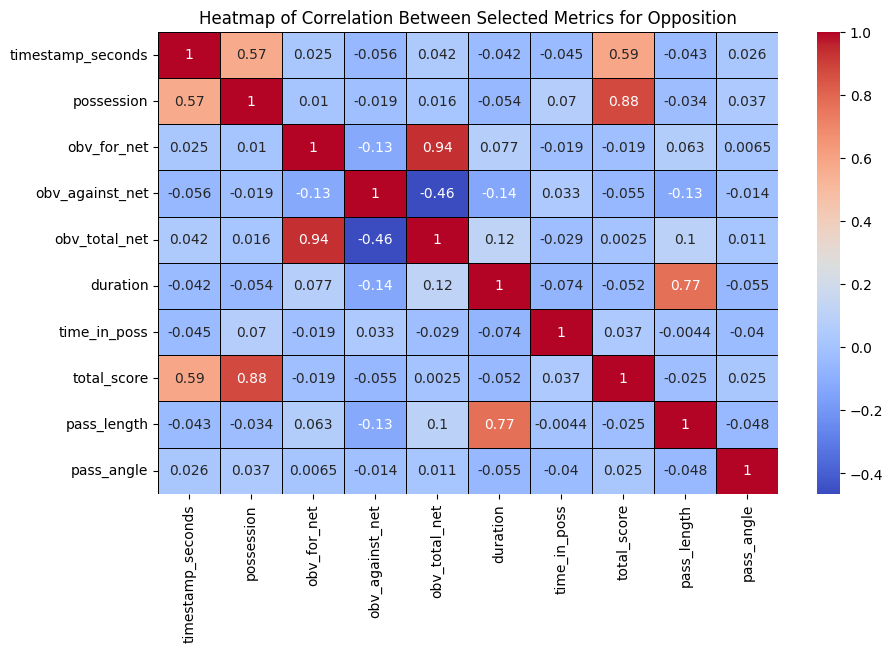

In [181]:
# Define function to convert timestamp to seconds
def timestamp_to_seconds(timestamp):
    h, m, s = timestamp.split(':')
    return int(h) * 3600 + int(m) * 60 + float(s)

# Filter the data for New York Red Bulls
Opposition_df = df[df['team'] == 'Opposition']

# Add a new column 'timestamp_seconds' to store the converted timestamp in seconds
if 'timestamp' in Opposition_df.columns and Opposition_df['timestamp'].dtype == object:
    try:
        Opposition_df['timestamp_seconds'] = Opposition_df['timestamp'].apply(timestamp_to_seconds)
    except Exception as e:
        print(f"Error converting timestamp: {e}")

# Update columns_of_interest to use the new timestamp_seconds column instead of the old timestamp column
columns_of_interest = ['timestamp_seconds', 'possession',
                       'obv_for_net', 'obv_against_net', 'obv_total_net', 'duration', 'time_in_poss', 'total_score',
                       'pass_length', 'pass_angle']

# Ensure there are no NA values in the columns
numeric_df = Opposition_df[columns_of_interest].dropna()

# Ensure all selected columns are numeric
numeric_df = numeric_df.select_dtypes(include=[np.number])

# Plot the correlation heatmap of the selected numeric columns
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_df.corr(), annot=True, linewidths=0.5, linecolor='black', cmap='coolwarm')
plt.title('Heatmap of Correlation Between Selected Metrics for Opposition')
plt.show()

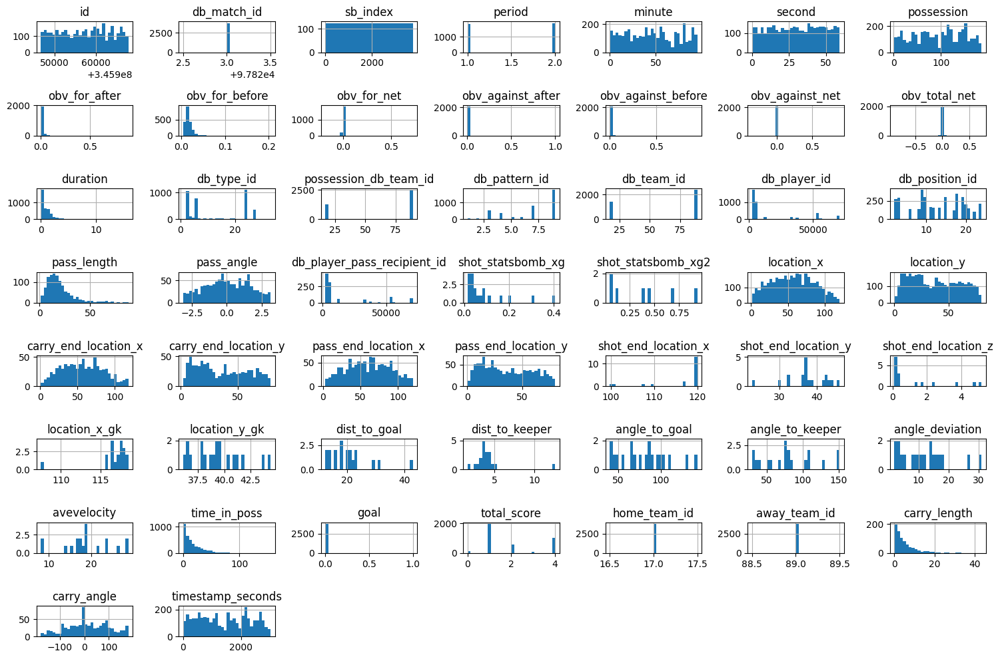

In [177]:
# Now, plot histograms for these columns
df.hist(bins=30, figsize=(15, 10))
plt.tight_layout()  # Adjust subplot spacing
plt.show()

In [183]:
df_nyrb = df[df['team'] == 'New York Red Bulls']

# Remove rows with NA values in the specified columns
df_cleaned = df_nyrb.dropna(subset=['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net',
                                    'obv_total_net', 'duration', 'time_in_poss', 'total_score',
                                    'pass_length', 'pass_angle'])

# Calculate average values for the specified variables for the New York Red Bulls
avg_values = df_cleaned[['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net', 'obv_total_net', 'duration',
                         'time_in_poss', 'total_score', 'pass_length', 'pass_angle']].mean()

# Plot violin plots for each feature
fig_violin = go.Figure()
for feature in ['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net',
                'obv_total_net', 'duration', 'time_in_poss', 'total_score',
                'pass_length', 'pass_angle']:
    fig_violin.add_trace(go.Violin(x=df_cleaned['sb_position'],
                                   y=df_cleaned[feature],
                                   name=feature,
                                   box_visible=True,
                                   meanline_visible=True))
    # Add a line for the average value of each variable
    fig_violin.add_shape(
        type="line", line_color="blue", line_width=3, opacity=1, line_dash="dot",
        x0=-0.5, x1=len(df_cleaned['sb_position'].unique())-0.5, y0=avg_values[feature], y1=avg_values[feature]
    )

# Set layout and title for the plot
fig_violin.update_layout(title='<b>NYRB Players Various Metrics distribution by position (avg. values dotted line)<b>',
                         xaxis_title='Position',
                         yaxis_title='Values')
fig_violin.show()

In [184]:
df_op = df[df['team'] == 'Opposition']

# Remove rows with NA values in the specified columns
df_cleaned = df_op.dropna(subset=['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net',
                                    'obv_total_net', 'duration', 'time_in_poss', 'total_score',
                                    'pass_length', 'pass_angle'])

# Calculate average values for the specified variables for the Opposition
avg_values = df_cleaned[['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net', 'obv_total_net', 'duration',
                         'time_in_poss', 'total_score', 'pass_length', 'pass_angle']].mean()

# Plot violin plots for each feature
fig_violin = go.Figure()
for feature in ['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net',
                'obv_total_net', 'duration', 'time_in_poss', 'total_score',
                'pass_length', 'pass_angle']:
    fig_violin.add_trace(go.Violin(x=df_cleaned['sb_position'],
                                   y=df_cleaned[feature],
                                   name=feature,
                                   box_visible=True,
                                   meanline_visible=True))
    # Add a line for the average value of each variable
    fig_violin.add_shape(
        type="line", line_color="blue", line_width=3, opacity=1, line_dash="dot",
        x0=-0.5, x1=len(df_cleaned['sb_position'].unique())-0.5, y0=avg_values[feature], y1=avg_values[feature]
    )

# Set layout and title for the plot
fig_violin.update_layout(title='<b>Opposition Players Various Metrics distribution by position (avg. values dotted line)<b>',
                         xaxis_title='Position',
                         yaxis_title='Values')
fig_violin.show()

In [185]:
#OLS
df_filtered = df[(df['team'] == 'New York Red Bulls') & (df['game_state'] == 'Winning')]

# Clean the data: drop rows with NA values in specific columns from the filtered data
features = ['obv_for_net', 'obv_against_net', 'obv_total_net', 'duration', 'time_in_poss', 'total_score', 'pass_length', 'pass_angle']
df_cleaned = df_filtered.dropna(subset=features)

# Define independent and dependent variables
X = df_cleaned[features[:-1]]  # Independent variables
y = df_cleaned['total_score']  # Dependent variable

# Add a constant term (intercept) to the model
X = sm.add_constant(X)

# Perform OLS regression
model = sm.OLS(y, X).fit()

# Model summary
model_summary = model.summary()
print(model_summary)

                            OLS Regression Results                            
Dep. Variable:            total_score   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.290e+20
Date:                Thu, 02 May 2024   Prob (F-statistic):               0.00
Time:                        20:36:22   Log-Likelihood:                 6604.2
No. Observations:                 332   AIC:                        -1.319e+04
Df Residuals:                     324   BIC:                        -1.316e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const           -2.665e-15   8.01e-11  -3.

In [192]:
model_filtered.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        total_score_log   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     7636.
Date:                Thu, 02 May 2024   Prob (F-statistic):               0.00
Time:                        20:39:57   Log-Likelihood:                 756.95
No. Observations:                 332   AIC:                            -1492.
Df Residuals:                     321   BIC:                            -1450.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.4061      0.004     94.510      0.000       0.398       0.415
timestamp_seconds -2.996e-05   1.98e-06    -15.145      0.000   -3.39e-05   -2.61e-05
possession            0.0009   6.06e-05     14.309      0.000       0.001       0.001
obv_for_net        8.134e+05   1.87e+06      0.436      0.663   -2.86e+06    4.48e+06
obv_against_net   -8.134e+05   1.87e+06     -0.436      0.663   -4.48e+06    2.86e+06
obv_total_net     -8.134e+05   1.87e+06     -0.436      0.663   -4.48e+06    2.86e+06
duration              0.0012      0.003      0.419      0.675      -0.004       0.007
time_in_poss       5.603e-05      0.000      0.532      0.595      -0.000       0.000
total_score           0.2865      0.002    124.923      0.000       0.282       0.291
pass_length          -0.0002      0.000     -0.879      0.380      -0.000       0.000
pass_angle            0.0004      0.001      0.393      0.695      -0.001       0.002
==============================================================================
Omnibus:                       86.714   Durbin-Watson:                   2.048
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              291.470
Skew:                          -1.127   Prob(JB):                     5.11e-64
Kurtosis:                       6.998   Cond. No.                     4.21e+12
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.06e-17. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [197]:
features = ['timestamp_seconds', 'possession', 'obv_for_net', 'obv_against_net',
            'obv_total_net', 'duration', 'time_in_poss', 'total_score',
            'pass_length', 'pass_angle']
df_cleaned = df_filtered.dropna(subset=features)
X = df_cleaned[features[:-1]]
y = df_cleaned['total_score']
X = sm.add_constant(X)
weights = y
wls_model = sm.WLS(y, X, weights=1 / (weights ** 2))
results = wls_model.fit()
print(results.summary())

                            WLS Regression Results                            
Dep. Variable:            total_score   R-squared:                       1.000
Model:                            WLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.183e+19
Date:                Thu, 02 May 2024   Prob (F-statistic):               0.00
Time:                        20:41:40   Log-Likelihood:                 6657.4
No. Observations:                 332   AIC:                        -1.329e+04
Df Residuals:                     322   BIC:                        -1.326e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             -1.665e-16   7.57e-1

In [199]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
import statsmodels.api as sm

# Prepare the independent variables
X = df_cleaned[['obv_for_after', 'obv_for_before', 'obv_for_net',
                'obv_against_after', 'obv_against_before', 'obv_against_net',
                'obv_total_net', 'duration', 'time_in_poss']]

# Adding a constant term for the intercept
X = sm.add_constant(X)

# Calculating VIF for each independent variable
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

              feature           VIF
0               const  2.826811e+01
1       obv_for_after  9.007199e+15
2      obv_for_before  4.503600e+15
3         obv_for_net  2.251800e+15
4   obv_against_after  1.286743e+15
5  obv_against_before  3.002400e+15
6     obv_against_net  3.002400e+15
7       obv_total_net  1.501200e+15
8            duration  1.077207e+00
9        time_in_poss  1.047582e+00


In [200]:
# Jarque-Bera Test
from scipy.stats import jarque_bera

# Assuming model_transformed is your trained regression model

# Calculate residuals for the transformed model
residuals_model_transformed = model_transformed.resid

# Jarque-Bera test on residuals
jb_test_model_transformed = jarque_bera(residuals_model_transformed)

jb_test_model_transformed_results = {
    'JB statistic': jb_test_model_transformed[0],
    'p-value': jb_test_model_transformed[1]
}

print("Jarque-Bera Test Results for Transformed Model:", jb_test_model_transformed_results)


Jarque-Bera Test Results for Transformed Model: {'JB statistic': 291.4699766611612, 'p-value': 5.106210893485516e-64}


In [201]:
formatted_p_value = "{:.10f}".format(jb_test_model_transformed_results['p-value'])

In [202]:
print("Formatted p-value:", formatted_p_value)

Formatted p-value: 0.0000000000


In [203]:
# durbin_watson test
durbin_watson_stat = sm.stats.durbin_watson(model.resid)

durbin_watson_stat

1.9235016834726453

In [204]:
# Standardizing the log values of total_score
df_cleaned['total_score_log'] = np.log(df_cleaned['total_score'] + 1)

# Calculating quantiles and IQR of total_score's log values
Q1 = df_cleaned['total_score_log'].quantile(0.25)
Q3 = df_cleaned['total_score_log'].quantile(0.75)
IQR = Q3 - Q1

# Defining the range for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtering out outliers
df_filtered = df_cleaned[(df_cleaned['total_score_log'] >= lower_bound) & (df_cleaned['total_score_log'] <= upper_bound)]

# Preparing independent and dependent variables
X = df_filtered[['obv_for_after', 'obv_for_before', 'obv_for_net',
                 'obv_against_after', 'obv_against_before', 'obv_against_net',
                 'obv_total_net', 'duration', 'time_in_poss']]
y = df_filtered['total_score_log']

# Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Fitting the model on the training set
X_train = sm.add_constant(X_train)  # Adding intercept
model_train = sm.OLS(y_train, X_train).fit()

# Making predictions on the test set
X_test = sm.add_constant(X_test)  # Adding intercept
y_pred = model_train.predict(X_test)

# Calculating Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)

print("Mean Squared Error:", mse)

Mean Squared Error: 0.14407997502193495


<ipython-input-204-4e4e4992e3cd>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### **PART2**

In [206]:
!pip install mplsoccer
from mplsoccer import Pitch
import seaborn as sns
from concurrent.futures import ProcessPoolExecutor

import pandas as pd

# 加载 CSV 文件
fr_cr = pd.read_csv('/content/match_events_for_test.csv')

In [229]:
# Define role abbreviations
role_abbreviations = {
    'Goalkeeper': 'GK',
    'Right Centre Forward': 'RCF',
    'Left Centre Forward': 'LCF',
    'Right Midfielder': 'RM',
    'Right Centre Back': 'RCB',
    'Right Wing Back': 'RWB',
    'Left Midfielder':'LM',
    'Left Defensive Midfielder': 'LDM',
    'Left Centre Midfielder': 'LCM',
    'Left Wing Back': 'LWB',
    'Right Defensive Midfielder': 'RDM',
    'Right Back': 'RB',
    'Left Centre Back': 'LCB',
    'Centre Defensive Midfielder':'CDM',
    'Right Centre Midfielder':'RCM',
    'Centre Back':'CB',
    'Left Back':'LB'
}

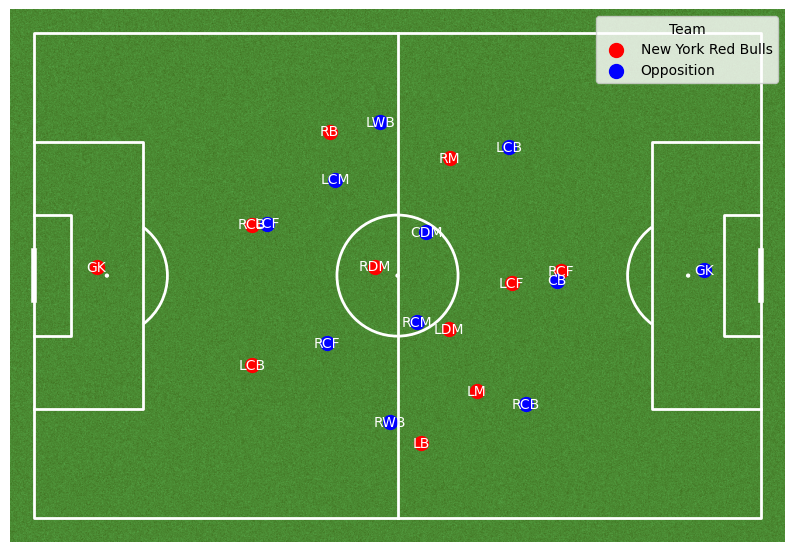

In [230]:
df = pd.read_csv('/content/match_events_for_test.csv')

# Ensure location data is numeric
df['location_x'] = pd.to_numeric(df['location_x'], errors='coerce')
df['location_y'] = pd.to_numeric(df['location_y'], errors='coerce')

# Data cleaning
df.dropna(subset=['location_x', 'location_y'], inplace=True)
df['location_y'] = df.apply(lambda x: 80 - x['location_y'] if x['team'] == "New York Red Bulls" else x['location_y'], axis=1)
df['location_x'] = df.apply(lambda x: 120 - x['location_x'] if x['team'] == "Opposition" else x['location_x'], axis=1)

# Calculate average positions by shirt number (position)
avgp = df.groupby(['team', 'sb_position']).agg({'location_x': 'mean', 'location_y': 'mean'}).reset_index()

# Create the pitch
fig, ax = plt.subplots(figsize=(10, 7))
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
pitch.draw(ax=ax)
·
# Plot average positions with scatter plot
for team in ['New York Red Bulls', 'Opposition']:
    team_data = avgp[avgp['team'] == team]
    team_color = 'red' if team == 'New York Red Bulls' else 'blue'
    ax.scatter(team_data['location_x'], team_data['location_y'], color=team_color, label=team, s=100)
    # Add jersey number labels with abbreviations
    for _, row in team_data.iterrows():
        position_abbr = role_abbreviations.get(row['sb_position'], row['sb_position'])  # Use abbreviation if available, else use the full position name
        ax.text(row['location_x'], row['location_y'], position_abbr, color='white', ha='center', va='center')

# Add a legend
ax.legend(loc='upper right', title="Team")

plt.show()

Goal Conversion Rate: 33.33%


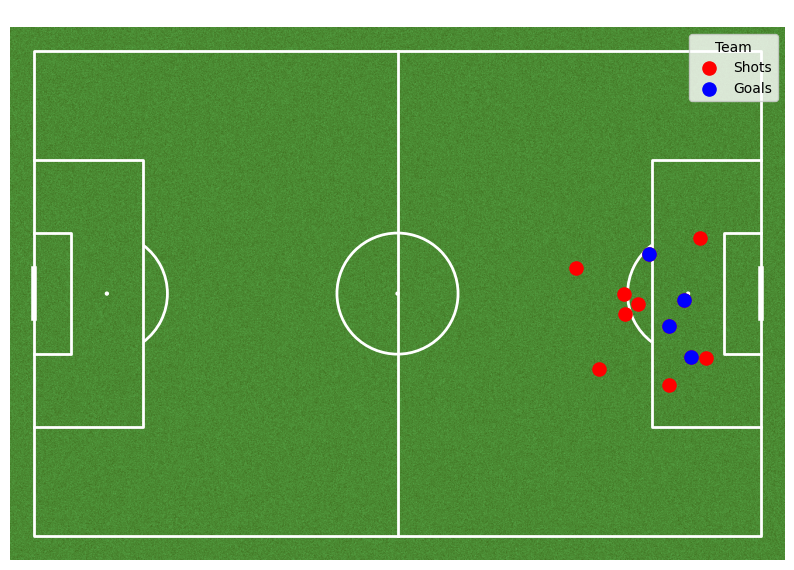

In [246]:
# Convert 'location_x' and 'location_y' to numeric, coerce errors
df['location_x'] = pd.to_numeric(df['location_x'], errors='coerce')
df['location_y'] = pd.to_numeric(df['location_y'], errors='coerce')

# Filter out shots events from 'New York Red Bulls'
shots = df[(df['team'] == 'New York Red Bulls') & (df['event_type'] == 'Shot')]

# Filter goals from the shots
goals = shots[shots['shot_outcome_name'] == 'Goal']

# Calculate the goal conversion rate
goal_conversion_rate = len(goals) / len(shots) * 100

print(f"Goal Conversion Rate: {goal_conversion_rate:.2f}%")

# Create canvas and axis
fig, ax = plt.subplots(figsize=(10, 7))

# Initialize plotting object
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
pitch.draw(ax=ax)

# Plot shot locations
pitch.scatter(shots['location_x'], shots['location_y'], ax=ax, color='red', label='Shots', s=90)
pitch.scatter(goals['location_x'], goals['location_y'], ax=ax, color='blue', label='Goals', s=90)

# Add legend
ax.legend(loc='upper right', title="Team")

# Display goal conversion rate on the plot
ax.text(x=1, y=1, s=f"Goal Conversion Rate: {goal_conversion_rate:.2f}%", color="white", fontsize=12, ha='right', va='bottom', transform=ax.transAxes)

plt.show()

<ipython-input-209-343ac4e21ef2>:18: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




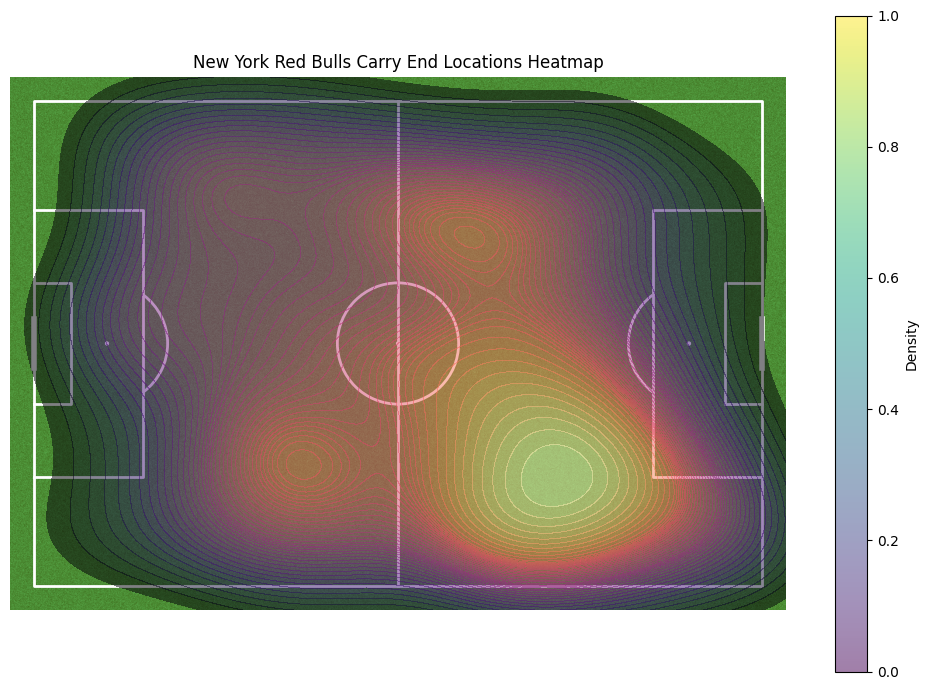

In [209]:
from mplsoccer import Pitch

# Load the data
df = pd.read_csv('/content/match_events_for_test.csv')

# Filter carry data for New York Red Bulls
df_carry_nyrb = df[(df['team'] == 'New York Red Bulls') & df['event_type'].str.contains('Carry')]
df_carry_filtered = df_carry_nyrb.dropna(subset=['carry_end_location_x', 'carry_end_location_y'])

# Prepare pitch visualization
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(10, 7))

# Create heatmap
sns.kdeplot(x=df_carry_filtered['carry_end_location_x'], y=df_carry_filtered['carry_end_location_y'], shade=True,
            alpha=0.5, levels=50, cmap='magma', ax=ax)

# Reverse y-axis to match the actual direction of a soccer pitch
plt.gca().invert_yaxis()

# Add color bar
cbar = fig.colorbar(ax.collections[0], ax=ax, orientation='vertical')
cbar.set_label('Density')

# Set title and display the plot
plt.title('New York Red Bulls Carry End Locations Heatmap')
plt.show()


<ipython-input-242-a545bbc02ac9>:11: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




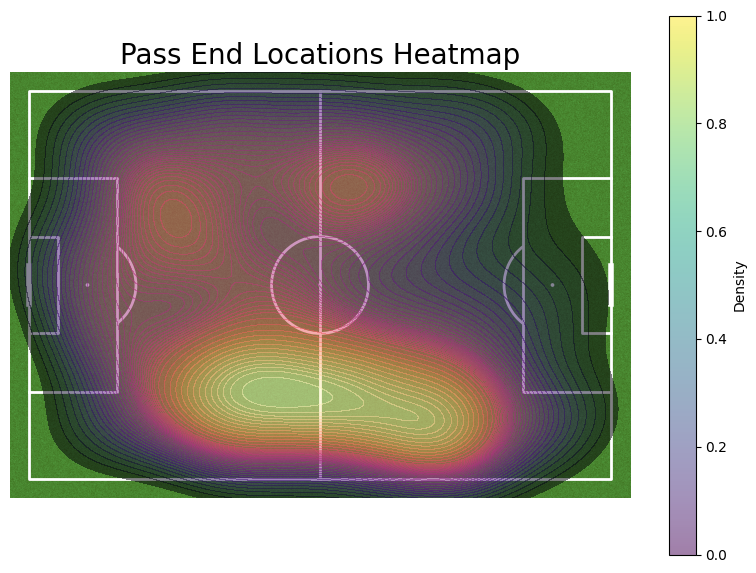

In [242]:
# Filter all passes for New York Red Bulls and Opposition that are complete
passes = df[(df['event_type'].str.contains('Pass')) & (df['pass_outcome_name'] != 'Incomplete')]
passes_filtered = passes.dropna(subset=['pass_end_location_x', 'pass_end_location_y'])

# Prepare the pitch graphic
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = plt.subplots(figsize=(10, 7))
pitch.draw(ax=ax)

# Create a heatmap of pass end locations
sns.kdeplot(x=passes_filtered['pass_end_location_x'], y=passes_filtered['pass_end_location_y'], shade=True,
            alpha=0.5, levels=50, cmap='magma', ax=ax)
plt.gca().invert_yaxis()

# Add color bar
cbar = fig.colorbar(ax.collections[0], ax=ax, orientation='vertical')
cbar.set_label('Density')

# Set title and display the figure
plt.title('Pass End Locations Heatmap', color='black', size=20)
plt.show()

<ipython-input-211-a479a61b8c4d>:7: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




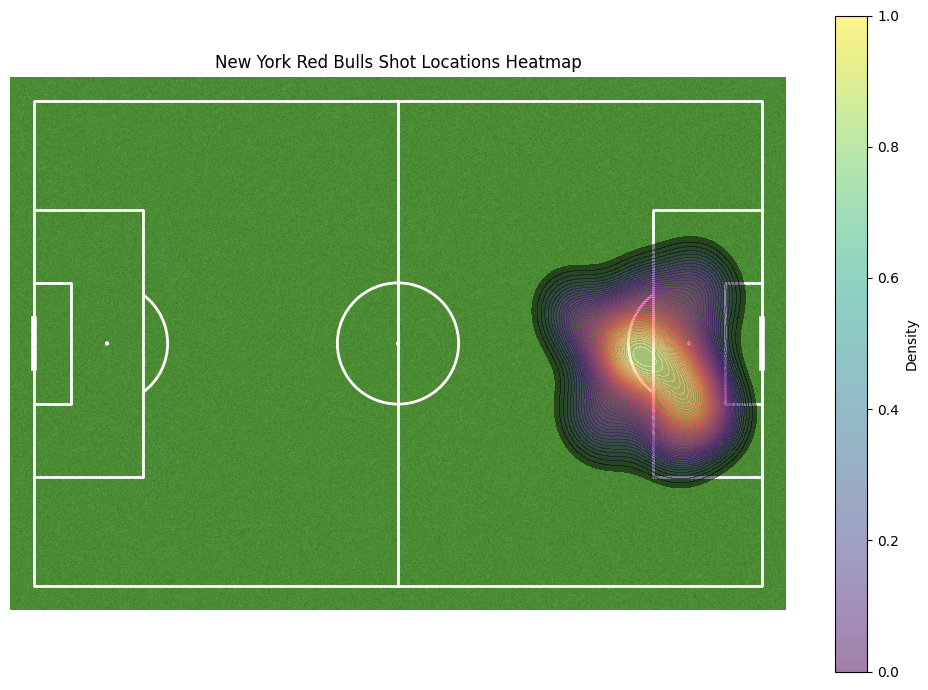

In [211]:
# Filter shot data for New York Red Bulls
df_shot_nyrb = df[(df['team'] == 'New York Red Bulls') & df['event_type'].str.contains('Shot')]
df_shot_filtered = df_shot_nyrb.dropna(subset=['location_x', 'location_y'])

# Create heatmap
fig, ax = pitch.draw(figsize=(10, 7))
sns.kdeplot(x=df_shot_filtered['location_x'], y=df_shot_filtered['location_y'], shade=True,
            alpha=0.5, levels=50, cmap='magma', ax=ax)
plt.gca().invert_yaxis()

# Add color bar
cbar = fig.colorbar(ax.collections[0], ax=ax, orientation='vertical')
cbar.set_label('Density')

plt.title('New York Red Bulls Shot Locations Heatmap')
plt.show()

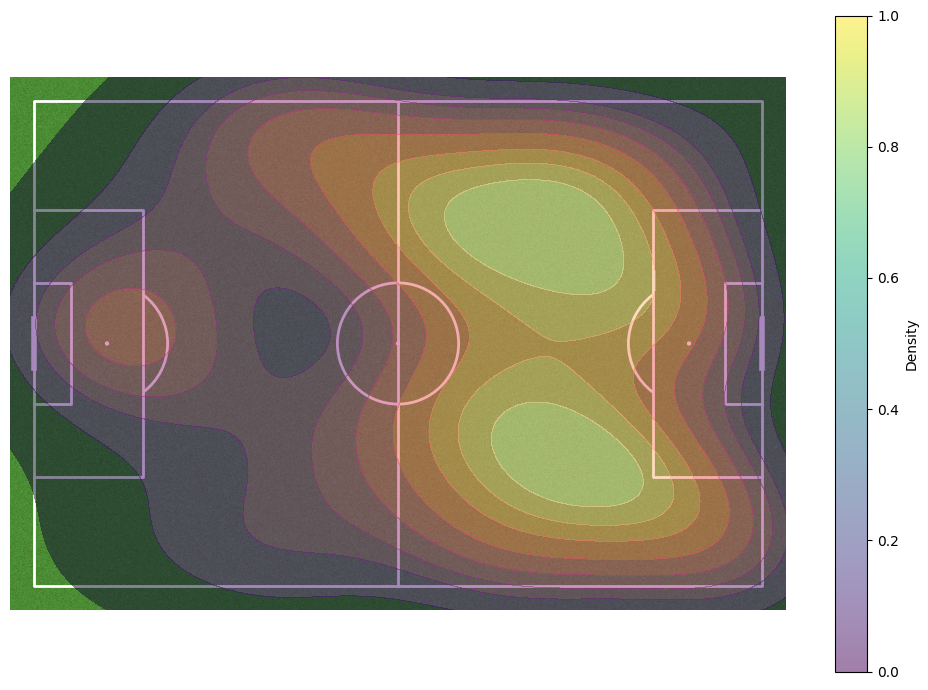

In [212]:
# Filter passes with pass outcome or ball receipt outcome as "incomplete" for New York Red Bulls
danger_passes = df[(df['team'] == 'New York Red Bulls') & ((df['pass_outcome_name'] == 'Incomplete') | (df['ball_receipt_outcome_name'] == 'Incomplete'))]

# Filter out rows with NA values, especially for pass start and end locations
danger_passes_filtered = danger_passes.dropna(subset=['location_x', 'location_y'])

# Prepare pitch visualization
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(10, 7))

# Create heatmap
sns.kdeplot(
    x=danger_passes_filtered['location_x'],
    y=danger_passes_filtered['location_y'],
    fill=True,  # Use fill=True as shade parameter is deprecated
    alpha=0.5,
    levels=10,
    cmap='magma',  # Use the same colormap as the carry heatmap
    ax=ax
)

# Reverse y-axis to match the actual direction of a soccer pitch
plt.gca().invert_yaxis()

# Add color bar
cbar = fig.colorbar(ax.collections[0], ax=ax, orientation='vertical')
cbar.set_label('Density')

# Set title and display the plot
plt.title('Danger Passes Heatmap for New York Red Bulls', color='white', size=20)
plt.show()

In [239]:
# Filter passes for New York Red Bulls and Opposition
nyrb_passes = df[(df['team'] == 'New York Red Bulls') & df['event_type'].str.contains('Pass')]
opposition_passes = df[(df['team'] == 'Opposition') & df['event_type'].str.contains('Pass')]

# Function to calculate pass percentages by height
def calculate_pass_height_percentages(passes):
    pass_counts = passes['pass_height_name'].value_counts()
    total_passes = pass_counts.sum()
    percentages = (pass_counts / total_passes * 100).round(2)
    return percentages.to_dict()

# Calculate percentages for each team
nyrb_pass_percentages = calculate_pass_height_percentages(nyrb_passes)
opposition_pass_percentages = calculate_pass_height_percentages(opposition_passes)

# Output the results
print("NY Red Bulls Pass Heights Percentages:")
for height, pct in nyrb_pass_percentages.items():
    print(f"{height}: {pct}%")

print("\nOpposition Pass Heights Percentages:")
for height, pct in opposition_pass_percentages.items():
    print(f"{height}: {pct}%")

NY Red Bulls Pass Heights Percentages:
Ground Pass: 62.22%
High Pass: 26.7%
Low Pass: 11.08%

Opposition Pass Heights Percentages:
Ground Pass: 75.0%
Low Pass: 13.56%
High Pass: 11.44%


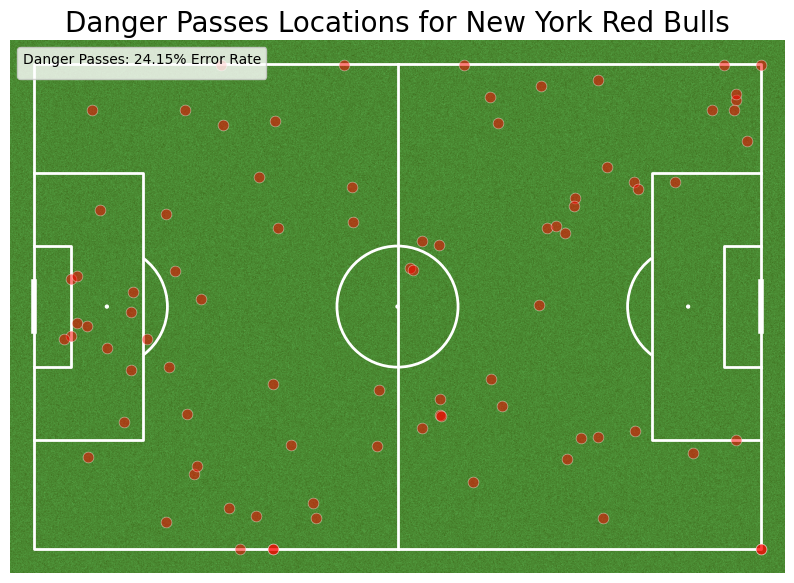

In [231]:
# Filter all passes for New York Red Bulls
total_passes = df[(df['team'] == 'New York Red Bulls') & (df['event_type'] == 'Pass')]

# Filter out incomplete passes specifically for New York Red Bulls
danger_passes = total_passes[(total_passes['pass_outcome_name'] == 'Incomplete') | (total_passes['ball_receipt_outcome_name'] == 'Incomplete')]

# Drop rows with NA values in crucial columns
danger_passes_filtered = danger_passes.dropna(subset=['location_x', 'location_y'])

# Calculate the Pass Error Rate
pass_error_rate = len(danger_passes_filtered) / len(total_passes) * 100  # Percentage

# Prepare the pitch graphic
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = plt.subplots(figsize=(10, 7))  # Specify the figure size here
pitch.draw(ax=ax)

# Plot each dangerous pass position
scatter = ax.scatter(danger_passes_filtered['location_x'], danger_passes_filtered['location_y'],
                     alpha=0.5, c='red', edgecolors='white', linewidths=0.5, s=60)

# Add legend
ax.legend(*scatter.legend_elements(), title=f"Danger Passes: {pass_error_rate:.2f}% Error Rate")

# Invert the y-axis to align with actual football pitch orientation
plt.gca().invert_yaxis()

# Set title and display the figure
plt.title('Danger Passes Locations for New York Red Bulls', color='black', size=20)
plt.show()

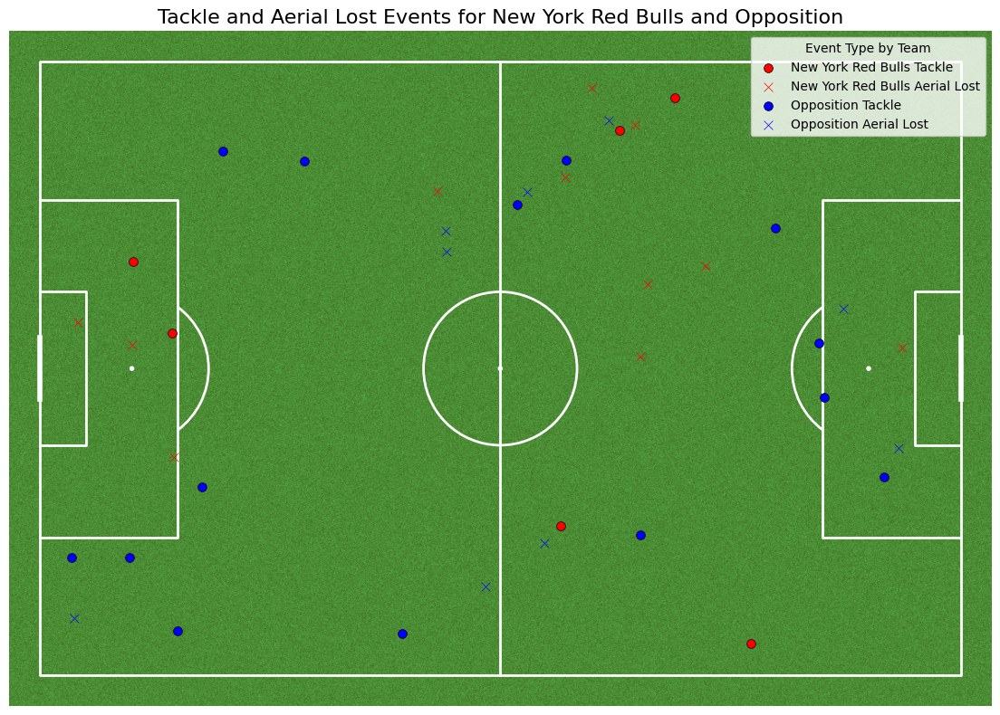

In [ ]:
# Plot graph for tackles and aerials lost for each team
tackles_and_aerials = df[(df['duel_type_name'].isin(['Tackle', 'Aerial Lost'])) &
                         (df['team'].isin(['New York Red Bulls', 'Opposition']))]

# Prepare pitch visualization
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(12, 8))

# Plot each event type for each team separately
for team, color in zip(['New York Red Bulls', 'Opposition'], ['red', 'blue']):
    for event, marker in zip(['Tackle', 'Aerial Lost'], ['o', 'x']):
        event_data = tackles_and_aerials[(tackles_and_aerials['team'] == team) &
                                         (tackles_and_aerials['duel_type_name'] == event)]
        ax.scatter(event_data['location_x'], event_data['location_y'], label=f'{team} {event}',
                   c=color, marker=marker, s=50, edgecolors='black', linewidths=0.5)

# Add legend
plt.legend(loc='upper right', title="Event Type by Team")
plt.title('Tackle and Aerial Lost Events for New York Red Bulls and Opposition', fontsize=16)

# Display the plot
plt.show()

In [ ]:
df = df.dropna(subset=['db_player_id'])

# Filter for New York Red Bulls
nyrb_players = df[df['team'] == 'New York Red Bulls']

# Display unique player IDs for New York Red Bulls
unique_player_ids = nyrb_players['db_player_id'].unique()
print("New York Red Bulls Player IDs:", unique_player_ids)

New York Red Bulls Player IDs: [55846. 33122.  2592.  2838.  3221.  2425.  2529.  3142.  2822. 53886.
 55888.  3044. 37789.  3066.  2344. 43530.]


In [ ]:
df = df.dropna(subset=['db_player_id'])

# Filter for New York Red Bulls
nyrb_players = df[df['team'] == 'Opposition']

# Display unique player IDs for New York Red Bulls
unique_player_ids = nyrb_players['db_player_id'].unique()
print("Opposition Player IDs:", unique_player_ids)

Opposition Player IDs: [ 5259.  5475.  3211.  5177. 53217. 70587.  2778.  5884. 11482.  3219.
  5759. 70481.  3214.  4498. 70586.]


In [ ]:
# Filter for New York Red Bulls recipients
nyrb_recipients = df[df['team'] == 'New York Red Bulls']['db_player_pass_recipient_id'].dropna().unique()

# Filter for Opposition team recipients
opposition_recipients = df[df['team'] == 'Opposition']['db_player_pass_recipient_id'].dropna().unique()

print("New York Red Bulls Pass Recipient IDs:", nyrb_recipients)
print("Opposition Pass Recipient IDs:", opposition_recipients)

New York Red Bulls Pass Recipient IDs: [ 2344.  3221. 53886.  2838.  2592. 43530. 37789.  3142.  2529. 33122.
  3044.  2822.  3066. 55888.  2425. 55846.]
Opposition Pass Recipient IDs: [53217.  5759. 70481.  5259. 70586.  5177.  3211.  5884.  3214.  3219.
 70587.  4498. 11482.  2778.  5475.]


### **PART2**

In [ ]:
df['minute'] = pd.to_numeric(df['minute'], errors='coerce')
df['second'] = pd.to_numeric(df['second'], errors='coerce')

# Drop rows where 'minute' or 'second' might be NA
df = df.dropna(subset=['minute', 'second'])

# Sort by 'minute' and 'second'
df_sorted = df.sort_values(by=['minute', 'second'])

# Reset the index after sorting
df_sorted.reset_index(drop=True, inplace=True)

# Now df_sorted is ready for further analysis or visualization
print(df_sorted.head())

          id  db_match_id                                 sb_id  sb_index  \
0  345961750        97823  DACE3AF1-B7A3-460A-83C9-C14662BC875D        14   
1  345963086        97823  911E3137-B70C-4448-BBF2-CC165D5BF675        21   
2  345964788        97823  726FBB9D-F35B-4CA1-8497-E00AED808075        25   
3  345959491        97823  7FC10B26-31FA-49DB-943D-9A043A1FDCE4        48   
4  345963776        97823  57D77B86-056D-4529-95FE-D2FA439CF6A0        52   

   period     timestamp  minute  second  possession  obv_for_after  ...  \
0       1  00:00:14.272       0      14           3       0.009649  ...   
1       1  00:00:21.067       0      21           3       0.012359  ...   
2       1  00:00:42.138       0      42           4       0.009546  ...   
3       1  00:01:22.323       1      22           5       0.011690  ...   
4       1  00:01:30.367       1      30           5       0.012947  ...   

   shot_outcome_name  duel_type_name  duel_outcome_name  pass_through_ball  \
0       

In [ ]:
# Check column names to ensure correctness
print(df.columns)

# Check unique values for 'event_type' and 'shot_outcome_name' columns to see the actual representations in the data
print(df['event_type'].unique())
print(df['shot_outcome_name'].unique())

# Based on the actual unique values, adjust the filtering conditions, paying attention to case sensitivity and whitespace
# For example, if 'Goal' is represented as 'goal', adjust accordingly
goal_events = df[(df['event_type'].str.strip().str.lower() == 'shot') &
                 (df['shot_outcome_name'].str.strip().str.lower() == 'goal')]

# Check if the target events are found
if goal_events.empty:
    print("No goals were recorded in the dataset.")
else:
    print("Goals found:", len(goal_events))

Index(['id', 'db_match_id', 'sb_id', 'sb_index', 'period', 'timestamp',
       'minute', 'second', 'possession', 'obv_for_after', 'obv_for_before',
       'obv_for_net', 'obv_against_after', 'obv_against_before',
       'obv_against_net', 'obv_total_net', 'duration', 'under_pressure',
       'counterpress', 'db_type_id', 'possession_db_team_id', 'db_pattern_id',
       'db_team_id', 'db_player_id', 'db_position_id', 'pass_length',
       'pass_angle', 'pass_outcome_name', 'db_player_pass_recipient_id',
       'shot_statsbomb_xg', 'shot_statsbomb_xg2', 'shot_key_pass_id',
       'location_x', 'location_y', 'carry_end_location_x',
       'carry_end_location_y', 'pass_end_location_x', 'pass_end_location_y',
       'shot_end_location_x', 'shot_end_location_y', 'shot_end_location_z',
       'location_x_gk', 'location_y_gk', 'dist_to_goal', 'dist_to_keeper',
       'angle_to_goal', 'angle_to_keeper', 'angle_deviation', 'avevelocity',
       'time_in_poss', 'goal', 'total_score', 'game_state'

In [ ]:
# Convert timestamp to a proper time format for correct sorting
df['timestamp'] = pd.to_timedelta(df['timestamp'])

# Sort the data by 'period' and 'timestamp'
sorted_data = df.sort_values(by=['period', 'timestamp'])

# Display the first few rows of the sorted dataframe to confirm sorting
sorted_data.head()

,id,db_match_id,sb_id,sb_index,period,timestamp,minute,second,possession,obv_for_after,...,shot_outcome_name,duel_type_name,duel_outcome_name,pass_through_ball,pass_cross,ball_receipt_outcome_name,pass_height_name,pass_type_name,home_team_id,away_team_id
596,345950738,97823,64F2E7DA-7A7E-481D-8A1C-32A457FF93D7,4,1,0 days 00:00:00,0,0,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,89
2908,345967205,97823,B1293FB2-2E56-4B81-AA05-F764ADE4FB16,3,1,0 days 00:00:00,0,0,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,89
3238,345952737,97823,771308BA-025F-4097-9393-4859F8FF0213,2,1,0 days 00:00:00,0,0,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,89
3282,345953737,97823,6C28FB11-A87F-432B-BE66-593A9C6AABB5,1,1,0 days 00:00:00,0,0,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,89
3423,345958485,97823,DEDBC45B-CF9A-4FBA-9724-8EC814009E56,5,1,0 days 00:00:00.765000,0,0,2,0.013432,...,NaN,NaN,NaN,NaN,NaN,NaN,Ground Pass,Kick Off,17,89


In [ ]:
goal_data = sorted_data[sorted_data['shot_outcome_name'] == 'Goal'].sort_values(by=['period', 'timestamp'])

# Display the first row to find the first goal
first_goal = goal_data.head(1) if not goal_data.empty else "No goal recorded in the data."
first_goal

,id,db_match_id,sb_id,sb_index,period,timestamp,minute,second,possession,obv_for_after,...,shot_outcome_name,duel_type_name,duel_outcome_name,pass_through_ball,pass_cross,ball_receipt_outcome_name,pass_height_name,pass_type_name,home_team_id,away_team_id
3263,345952880,97823,A76DC6CF-48F4-4366-A777-5101783FD4DA,143,1,0 days 00:02:52.776000,2,52,8,0.144196,...,Goal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17,89


In [ ]:
goal_data = sorted_data[sorted_data['shot_outcome_name'] == 'Goal'].sort_values(by=['period', 'timestamp'])

# Find the first goal
first_goal = goal_data.head(1) if not goal_data.empty else None

if first_goal is not None:
    # Print the first goal data
    print("First Goal Details:")
    print(first_goal)

    # Extract the time and period of the first goal
    goal_period = first_goal.iloc[0]['period']
    goal_timestamp = first_goal.iloc[0]['timestamp']

    # Filter actions that occurred before this goal within the same period
    actions_before_goal = sorted_data[(sorted_data['period'] == goal_period) & (sorted_data['timestamp'] < goal_timestamp)]

    # Assuming you are interested in 'carry' and 'pass' events
    relevant_actions = actions_before_goal[actions_before_goal['event_type'].isin(['Carry', 'Pass'])]

    # Print each relevant action along with the pattern if available
    print("\nActions before the first goal:")
    for index, action in relevant_actions.iterrows():
        pattern = action['pattern'] if 'pattern' in action and not pd.isna(action['pattern']) else "No pattern data"
        print(f"Index {index}: {action['event_type']} from {action['location_x']}, {action['location_y']} "
              f"to {action.get('pass_end_location_x') or action.get('carry_end_location_x')}, "
              f"{action.get('pass_end_location_y') or action.get('carry_end_location_y')} - Pattern: {pattern}")
else:
    print("No goal recorded in the data.")

First Goal Details:
             id  db_match_id                                 sb_id  sb_index  \
3263  345952880        97823  A76DC6CF-48F4-4366-A777-5101783FD4DA       143   

      period              timestamp  minute  second  possession  \
3263       1 0 days 00:02:52.776000       2      52           8   

      obv_for_after  ...  shot_outcome_name  duel_type_name  \
3263       0.144196  ...               Goal             NaN   

      duel_outcome_name  pass_through_ball  pass_cross  \
3263                NaN                NaN         NaN   

      ball_receipt_outcome_name  pass_height_name pass_type_name home_team_id  \
3263                        NaN               NaN            NaN           17   

      away_team_id  
3263            89  

[1 rows x 70 columns]

Actions before the first goal:
Index 3423: Pass from 60.0, 40.0 to 46.5999984741211, 43.5 - Pattern: From Kick Off
Index 1386: Carry from 46.5999984741211, 43.5 to nan, nan - Pattern: From Kick Off
Index 117: Pa

In [ ]:
sorted_data = df[df['team'] == 'New York Red Bulls']

# Filter to find all 'Goal' shot outcomes and sort by period and timestamp
goal_data = sorted_data[sorted_data['shot_outcome_name'] == 'Goal'].sort_values(by=['period', 'timestamp'])

# Find the first goal
first_goal = goal_data.head(1) if not goal_data.empty else None

if first_goal is not None:
    # Print the first goal data
    print("First Goal Details:")
    print(first_goal)

    # Extract the time and period of the first goal
    goal_period = first_goal.iloc[0]['period']
    goal_timestamp = first_goal.iloc[0]['timestamp']

    # Filter actions that occurred before this goal within the same period
    actions_before_goal = sorted_data[(sorted_data['period'] == goal_period) & (sorted_data['timestamp'] < goal_timestamp)]

    # Assuming you are interested in 'carry' and 'pass' events
    relevant_actions = actions_before_goal[actions_before_goal['event_type'].isin(['Carry', 'Pass'])]

    # Print each relevant action along with the pattern if available
    print("\nActions before the first goal:")
    for index, action in relevant_actions.iterrows():
        pattern = action['pattern'] if 'pattern' in action and not pd.isna(action['pattern']) else "No pattern data"
        print(f"Index {index}: {action['event_type']} from {action['location_x']}, {action['location_y']} "
              f"to {action.get('pass_end_location_x') or action.get('carry_end_location_x')}, "
              f"{action.get('pass_end_location_y') or action.get('carry_end_location_y')} - Pattern: {pattern}")

First Goal Details:
             id  db_match_id                                 sb_id  sb_index  \
3263  345952880        97823  A76DC6CF-48F4-4366-A777-5101783FD4DA       143   

      period              timestamp  minute  second  possession  \
3263       1 0 days 00:02:52.776000       2      52           8   

      obv_for_after  ...  shot_outcome_name  duel_type_name  \
3263       0.144196  ...               Goal             NaN   

      duel_outcome_name  pass_through_ball  pass_cross  \
3263                NaN                NaN         NaN   

      ball_receipt_outcome_name  pass_height_name pass_type_name home_team_id  \
3263                        NaN               NaN            NaN           17   

      away_team_id  
3263            89  

[1 rows x 70 columns]

Actions before the first goal:
Index 75: Pass from 78.3000030517578, 25.2000007629395 to 71.0999984741211, 25.8999996185303 - Pattern: From Throw In
Index 146: Pass from 91.0, 52.7000007629395 to 101.0, 45.40000

In [ ]:
df = pd.read_csv('/content/match_events_for_test.csv')
# Convert minute and second columns to numeric if not already
df['minute'] = pd.to_numeric(df['minute'], errors='coerce')
df['second'] = pd.to_numeric(df['second'], errors='coerce')

# Sort the DataFrame chronologically by period, minute, and second
df.sort_values(by=['period', 'minute', 'second'], inplace=True)

# Filter to find all 'Goal' shot outcomes by New York Red Bulls
nyrb_goals = df[(df['team'] == 'New York Red Bulls') & (df['shot_outcome_name'] == 'Goal')]
nyrb_goals.sort_values(by=['period', 'timestamp'], inplace=True)

# Identify the index and time of the first NYRB goal
if not nyrb_goals.empty:
    first_goal = nyrb_goals.iloc[0]
    first_goal_time = first_goal['timestamp']
    first_goal_period = first_goal['period']

    # Filter actions from the opposition that occurred before this goal within the same period
    opposition_actions = df[(df['team'] != 'New York Red Bulls') & (df['period'] == first_goal_period) & (df['timestamp'] < first_goal_time)]

    # Assuming you are interested in all events by the opposition
    print("Opposition Actions Before the First NYRB Goal:")
    for index, action in opposition_actions.iterrows():
        pattern = action['pattern'] if 'pattern' in action and not pd.isna(action['pattern']) else "No pattern data"
        print(f"Index {index}: {action['event_type']} by {action['team']} from {action['location_x']}, {action['location_y']} "
              f"to {action.get('pass_end_location_x') or action.get('carry_end_location_x') or action.get('shot_end_location_x')}, "
              f"{action.get('pass_end_location_y') or action.get('carry_end_location_y') or action.get('shot_end_location_y')} - Pattern: {pattern}")
else:
    print("No goals recorded by New York Red Bulls.")

Opposition Actions Before the First NYRB Goal:
Index 2908: Half Start by Opposition from nan, nan to nan, nan - Pattern: Regular Play
Index 3238: Starting XI by Opposition from nan, nan to nan, nan - Pattern: Regular Play
Index 3423: Pass by Opposition from 60.0, 40.0 to 46.5999984741211, 43.5 - Pattern: From Kick Off
Index 1386: Carry by Opposition from 46.5999984741211, 43.5 to nan, nan - Pattern: From Kick Off
Index 2372: Ball Receipt* by Opposition from 46.5999984741211, 43.5 to nan, nan - Pattern: From Kick Off
Index 117: Pass by Opposition from 46.4000015258789, 44.7000007629395 to 83.3000030517578, 65.3000030517578 - Pattern: From Kick Off
Index 466: Ball Receipt* by Opposition from 83.3000030517578, 65.3000030517578 to nan, nan - Pattern: From Kick Off
Index 823: Pass by Opposition from 83.3000030517578, 65.3000030517578 to 98.0999984741211, 74.3000030517578 - Pattern: From Kick Off
Index 1098: Ball Receipt* by Opposition from 98.0999984741211, 74.3000030517578 to nan, nan - Pa

<ipython-input-53-ea37527db7b3>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import pandas as pd

# Filter for the goal-ending possession (replace 'goal_possession' with the correct value)
goal_possession = 8  # example possession number for the goal
goal_period = 1      # example period of the game when the goal was scored
events_before_goal = df[(df['possession'] == goal_possession) & (df['period'] == goal_period)]

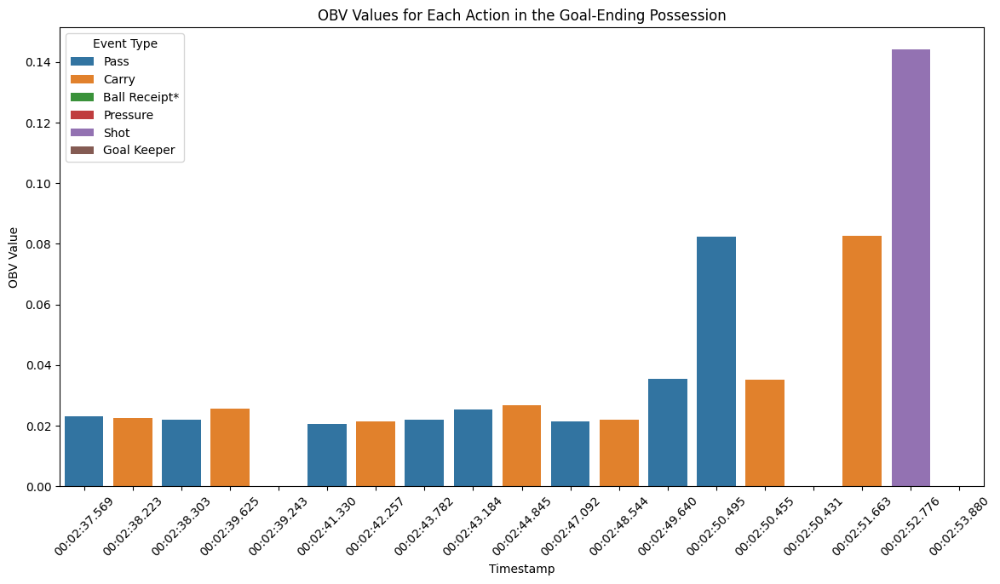

In [ ]:
plt.figure(figsize=(14, 7))

# Create a bar plot for OBV values
sns.barplot(data=events_before_goal, x='timestamp', y='obv_for_after', hue='event_type', dodge=False)

# Adding details to the plot
plt.title('OBV Values for Each Action in the Goal-Ending Possession')
plt.xlabel('Timestamp')
plt.ylabel('OBV Value')
plt.xticks(rotation=45)

# Enhance legend readability
plt.legend(title='Event Type', loc='upper left')

plt.show()

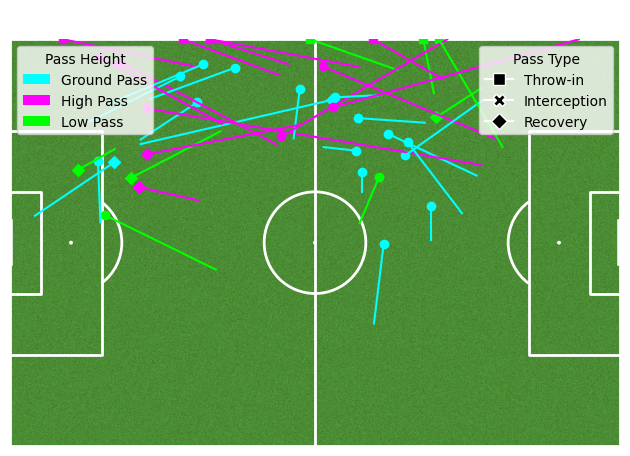

In [ ]:
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# Load your dataframe here
# df = pd.read_csv('path_to_your_data.csv')

# Filter for player with id 2529 and ensure both start and end locations are available
player_passes = df[(df['db_player_id'] == 2529) & df['location_x'].notna() & df['location_y'].notna() & df['pass_end_location_x'].notna() & df['pass_end_location_y'].notna()]

# Prepare the pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw()
plt.gca().invert_yaxis()

# Define colors for pass height
pass_height_colors = {
    'Ground Pass': 'cyan',
    'High Pass': 'magenta',
    'Low Pass': 'lime'
}

pass_type_markers = {
    'Throw-in': 's',  # square marker
    'Interception': 'X',  # x marker
    'Recovery': 'D'  # diamond marker
}

# Loop through each pass and plot
for idx, pass_ in player_passes.iterrows():
    # Determine color based on pass height
    pass_height = pass_['pass_height_name']
    color = pass_height_colors.get(pass_height, 'grey')  # Default to grey if no height info

    # Add the pass lines
    plt.plot(
        [pass_['location_x'], pass_['pass_end_location_x']],
        [pass_['location_y'], pass_['pass_end_location_y']],
        color=color
    )

    # Add start location scatter point with different markers for pass types
    pass_type = pass_['pass_type_name']
    marker = pass_type_markers.get(pass_type, 'o')  # Default to circle if no type info
    plt.scatter(
        pass_['location_x'],
        pass_['location_y'],
        color=color,
        marker=marker
    )

# Create custom legends for pass height and type
pass_height_legend = [Patch(facecolor=pass_height_colors[key], label=key) for key in pass_height_colors]
pass_type_legend = [Line2D([0], [0], marker=pass_type_markers[key], color='w', markerfacecolor='black', markersize=8, label=key) for key in pass_type_markers]
legend1 = plt.legend(handles=pass_height_legend, loc='upper left', title="Pass Height")
legend2 = plt.legend(handles=pass_type_legend, loc='upper right', title="Pass Type")
plt.gca().add_artist(legend1)

# Set limits, labels, and title
plt.xlim(0, 120)
plt.ylim(0, 80)
plt.title('Player 2529 Pass Map', color='white', size=20)

plt.show()

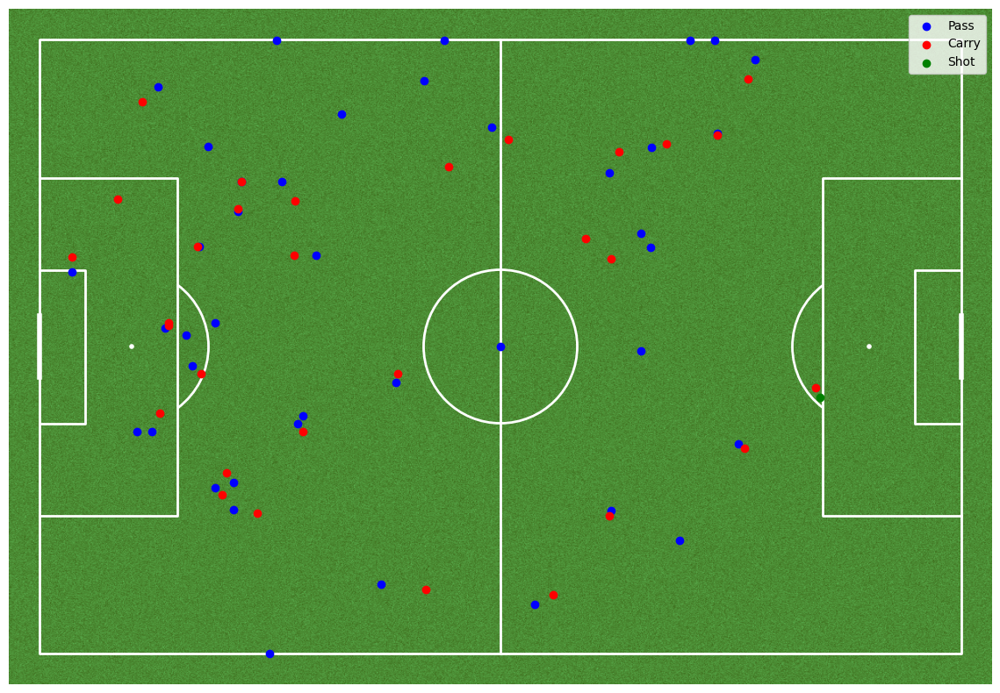

In [ ]:
df['period'] = pd.to_numeric(df['period'], errors='coerce')
df['minute'] = pd.to_numeric(df['minute'], errors='coerce')
df['second'] = pd.to_numeric(df['second'], errors='coerce')

# Sort data by period, minute, and second
df_sorted = df.sort_values(by=['period', 'minute', 'second'])

# Identify the first goal
goal_data = df_sorted[(df_sorted['event_type'] == 'Shot') & (df_sorted['shot_outcome_name'] == 'Goal')]
first_goal_index = goal_data.index[0] if not goal_data.empty else None

if first_goal_index:
    # Filter actions before the first goal
    actions_before_goal = df_sorted.loc[:first_goal_index]

    # Set up the pitch
    pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
    fig, ax = pitch.draw(figsize=(12, 8))

    # Plot different types of events with different colors and markers
    for event_type, color in [('Pass', 'blue'), ('Carry', 'red'), ('Shot', 'green')]:
        event_data = actions_before_goal[actions_before_goal['event_type'] == event_type]
        ax.scatter(event_data['location_x'], event_data['location_y'], label=event_type, color=color)

    # Add legend
    plt.legend(loc='upper right')

    # Show plot
    plt.show()

In [ ]:
# Filter out NA values and get unique values from the 'shot_outcome_name' column
unique_shot_outcomes = df['shot_outcome_name'].dropna().unique()

# Print the unique shot outcomes
print("Unique Shot Outcomes (excluding NAs):")
for outcome in unique_shot_outcomes:
    print(outcome)

Unique Shot Outcomes (excluding NAs):
Goal
Wayward
Off T
Blocked
Saved


In [ ]:
# Convert minute and second columns to numeric if they are not already
df['minute'] = pd.to_numeric(df['minute'], errors='coerce')
df['second'] = pd.to_numeric(df['second'], errors='coerce')

# Filter the dataframe for specified shot outcomes
desired_outcomes = ['Goal', 'Wayward', 'Off T', 'Blocked', 'Saved']
filtered_df = df[df['shot_outcome_name'].isin(desired_outcomes)]

# Sort the filtered dataframe chronologically by period, minute, and second
filtered_df.sort_values(by=['period', 'minute', 'second'], inplace=True)

# Select and display relevant player data
# Assuming 'player_name' is the column that specifies the player; adjust as needed
print(filtered_df[['db_player_id', 'team', 'minute', 'second', 'shot_outcome_name']])

      db_player_id                team  minute  second shot_outcome_name
3263        2838.0  New York Red Bulls       2      52              Goal
3325        2838.0  New York Red Bulls      18      17           Wayward
3130       33122.0  New York Red Bulls      28       6             Off T
3413        3142.0  New York Red Bulls      29       0           Blocked
3500       33122.0  New York Red Bulls      30      33             Off T
3039        2838.0  New York Red Bulls      32      30           Blocked
3552        2592.0  New York Red Bulls      42      14             Off T
3508        2838.0  New York Red Bulls      50      26              Goal
3674        2838.0  New York Red Bulls      51      50             Off T
3042        2822.0  New York Red Bulls      61      20             Saved
3355        3142.0  New York Red Bulls      65       3              Goal
3482        2838.0  New York Red Bulls      69       8              Goal


<ipython-input-59-849b2025cc87>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df = df.reset_index(drop=True)
if 3262 in df.index:
    print(df.loc[3262])
else:
    print("Index 3262 does not exist in the DataFrame.")

Index 3262 does not exist in the DataFrame.


In [ ]:
if 'pattern' in df.columns:
    # Get the unique values from the "pattern" column
    unique_patterns = df['pattern'].unique()

    # Print the unique patterns
    print("Unique categories in the 'pattern' column:")
    for pattern in unique_patterns:
        print(pattern)

Unique categories in the 'pattern' column:
Regular Play
From Kick Off
From Throw In
From Keeper
From Free Kick
From Goal Kick
From Counter
From Corner


### **Animation**

In [ ]:
unique_positions = df['sb_position'].unique()
unique_positions

array([nan, 'Right Centre Forward', 'Left Centre Forward', 'Goalkeeper',
       'Right Midfielder', 'Right Centre Back',
       'Left Defensive Midfielder', 'Left Midfielder', 'Left Back',
       'Right Defensive Midfielder', 'Right Back', 'Left Centre Back'],
      dtype=object)

In [ ]:
# Define role abbreviations
role_abbreviations = {
    'Goalkeeper': 'GK',
    'Right Centre Forward': 'RCF',
    'Left Centre Forward': 'LCF',
    'Right Midfielder': 'RM',
    'Right Centre Back': 'RCB',
    'Left Defensive Midfielder': 'LDM',
    'Left Midfielder': 'LM',
    'Left Back': 'LB',
    'Right Defensive Midfielder': 'RDM',
    'Right Back': 'RB',
    'Left Centre Back': 'LCB'
}

<ipython-input-65-8d2aef4ac31f>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-65-8d2aef4ac31f>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



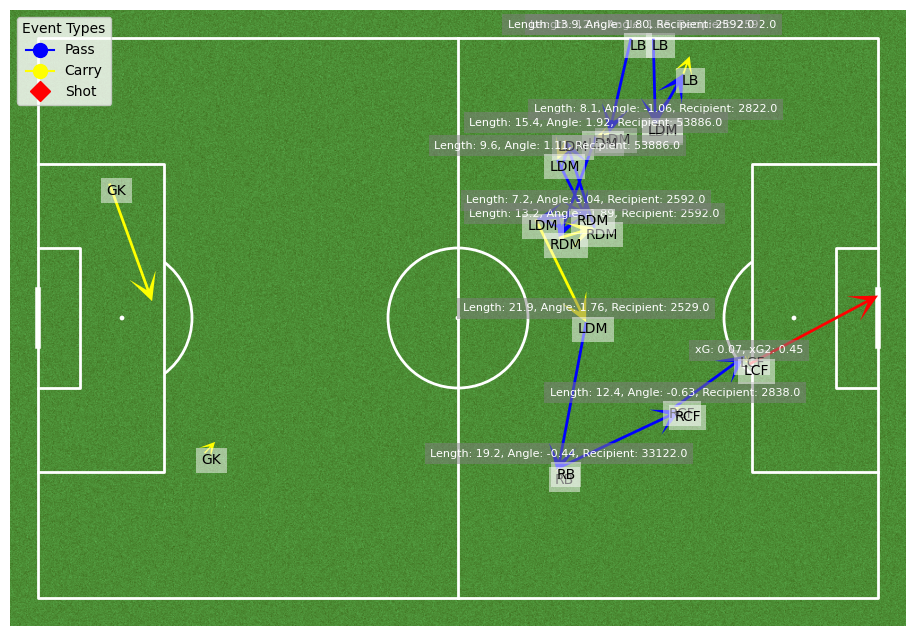

In [ ]:
# Filter for New York Red Bulls, excluding incomplete passes
df = df[(df['team'] == 'New York Red Bulls') & (df['event_type'].isin(['Pass', 'Carry', 'Shot'])) & (df['pass_outcome_name'] != 'Incomplete')]

# Sort by game time
df.sort_values(by=['period', 'minute', 'second'], inplace=True)

# Map player roles using abbreviations
df['player_role'] = df['sb_position'].map(role_abbreviations).fillna('UNK')  # 'UNK' for unknown positions

# Identify the first goal
first_goal_index = df[(df['event_type'] == 'Shot') & (df['shot_outcome_name'] == 'Goal')].index.min()
actions_before_goal = df.loc[:first_goal_index] if first_goal_index is not None else pd.DataFrame()

# Set up the pitch
fig, ax = plt.subplots(figsize=(12, 8))
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
pitch.draw(ax=ax)

# Define colors for each event type
event_colors = {'Pass': 'blue', 'Carry': 'yellow', 'Shot': 'red'}

# Plot each action with arrows for pass and carry, dots for shot
for index, action in actions_before_goal.iterrows():
    start_x, start_y = action['location_x'], action['location_y']
    player_role = action['player_role']  # Using the abbreviation
    event_type = action['event_type']

    # Determine the end location and draw paths
    end_x, end_y = action.get(f'{event_type.lower()}_end_location_x'), action.get(f'{event_type.lower()}_end_location_y')
    if pd.notna(end_x):
        pitch.arrows(start_x, start_y, end_x, end_y, width=2, headwidth=10, headlength=10,
                     color=event_colors[event_type], ax=ax, zorder=2)

    # Additional details
    details = []
    if event_type == 'Pass':
        details.append(f"Length: {action['pass_length']:.1f}" if pd.notna(action['pass_length']) else "")
        details.append(f"Angle: {action['pass_angle']:.2f}" if pd.notna(action['pass_angle']) else "")
        details.append(f"Recipient: {action['db_player_pass_recipient_id']}" if pd.notna(action['db_player_pass_recipient_id']) else "")
    elif event_type == 'Shot':
        details.append(f"xG: {action['shot_statsbomb_xg']:.2f}" if pd.notna(action['shot_statsbomb_xg']) else "")
        details.append(f"xG2: {action['shot_statsbomb_xg2']:.2f}" if pd.notna(action['shot_statsbomb_xg2']) else "")

    # Join details and display if not empty
    details_text = ", ".join(filter(None, details))
    if details_text:
        ax.text(start_x, start_y - 2, details_text, color='white', ha='center', va='center',
                fontsize=8, bbox=dict(facecolor='gray', alpha=0.5, edgecolor='none'))

    # Annotate player positions with their roles beside the points
    ax.text(start_x + 1, start_y + 1, player_role, color='black', ha='center', va='center',
            fontsize=10, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

# Create legend with specific markers
legend_elements = [plt.Line2D([0], [0], color=event_colors[event], marker='o' if event != 'Shot' else 'D',
                              linestyle='-' if event != 'Shot' else '', markersize=10, label=event)
                   for event in event_colors]
ax.legend(handles=legend_elements, loc='upper left', title="Event Types")

plt.show()

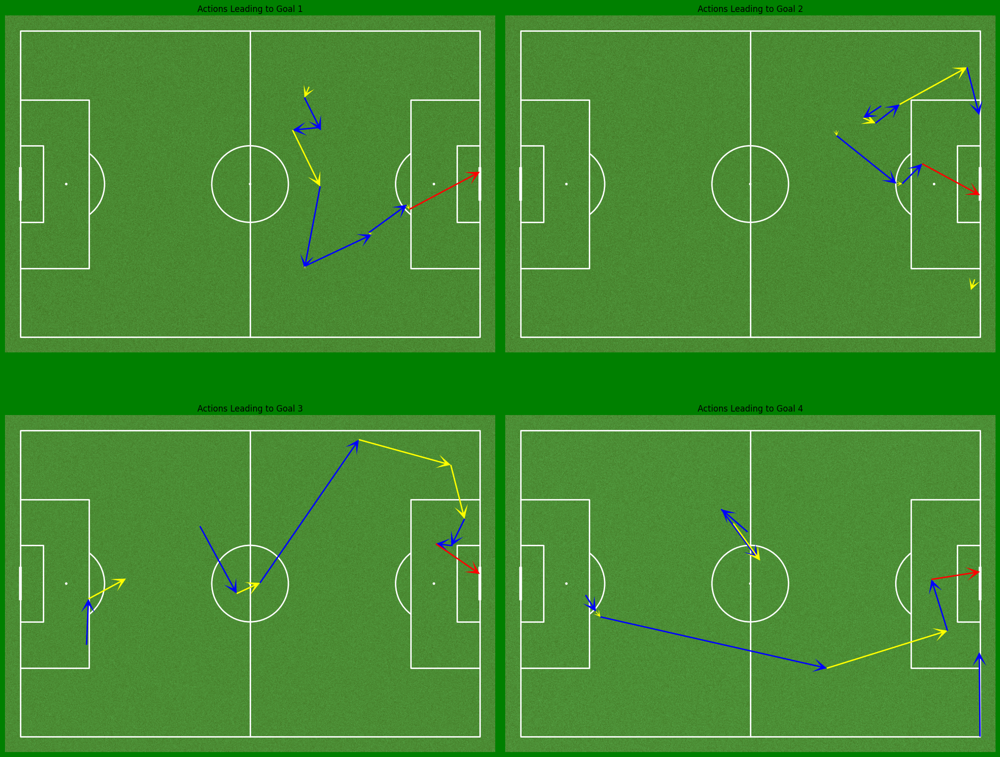

In [ ]:
# Filter data for New York Red Bulls and exclude cases where pass outcome is "Incomplete"
df = df[(df['team'] == 'New York Red Bulls') &
        (df['event_type'].isin(['Pass', 'Carry', 'Shot'])) &
        (df['pass_outcome_name'] != 'Incomplete')]

# Sort by match time and reset index
df.sort_values(by=['period', 'minute', 'second'], inplace=True)
df.reset_index(drop=True, inplace=True)

# Map player roles
role_abbreviations = {
    'Goalkeeper': 'GK',
    'Right Centre Forward': 'RCF',
    'Left Centre Forward': 'LCF',
    'Right Midfielder': 'RM',
    'Right Centre Back': 'RCB',
    'Left Defensive Midfielder': 'LDM',
    'Left Midfielder': 'LM',
    'Left Back': 'LB',
    'Right Defensive Midfielder': 'RDM',
    'Right Back': 'RB',
    'Left Centre Back': 'LCB'
}
df['player_role'] = df['sb_position'].map(role_abbreviations).fillna('UNK')

# Find all shots marked as goals
goal_indices = df[(df['event_type'] == 'Shot') & (df['shot_outcome_name'] == 'Goal')].index

# Check if enough goal data is available
if len(goal_indices) < 4:
    print("Not enough goal data available.")
    exit()

# Create figure and subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 16), constrained_layout=True)
axs = axs.flatten()
fig.set_facecolor('green')

# Plot actions leading to each goal
for i, ax in enumerate(axs):
    if i < len(goal_indices):
        pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
        pitch.draw(ax=ax)

        # Get 10 actions leading up to the goal
        goal_index = goal_indices[i]
        start_index = max(goal_index - 10, 0)  # Adjustable number of actions
        actions = df.loc[start_index:goal_index]

        # Define colors for event types
        event_colors = {'Pass': 'blue', 'Carry': 'yellow', 'Shot': 'red'}

        # Plot action trajectories
        for _, action in actions.iterrows():
            x, y = action['location_x'], action['location_y']
            event_type = action['event_type']
            end_x, end_y = action.get(f'{event_type.lower()}_end_location_x'), action.get(f'{event_type.lower()}_end_location_y')
            if pd.notna(end_x) and pd.notna(end_y):
                pitch.arrows(x, y, end_x, end_y, width=2, headwidth=10, headlength=10, color=event_colors[event_type], ax=ax, zorder=2)
            else:
                ax.scatter(x, y, color=event_colors[event_type], s=100, edgecolors='black', zorder=3)

        ax.set_title(f'Actions Leading to Goal {i + 1}')
plt.show()

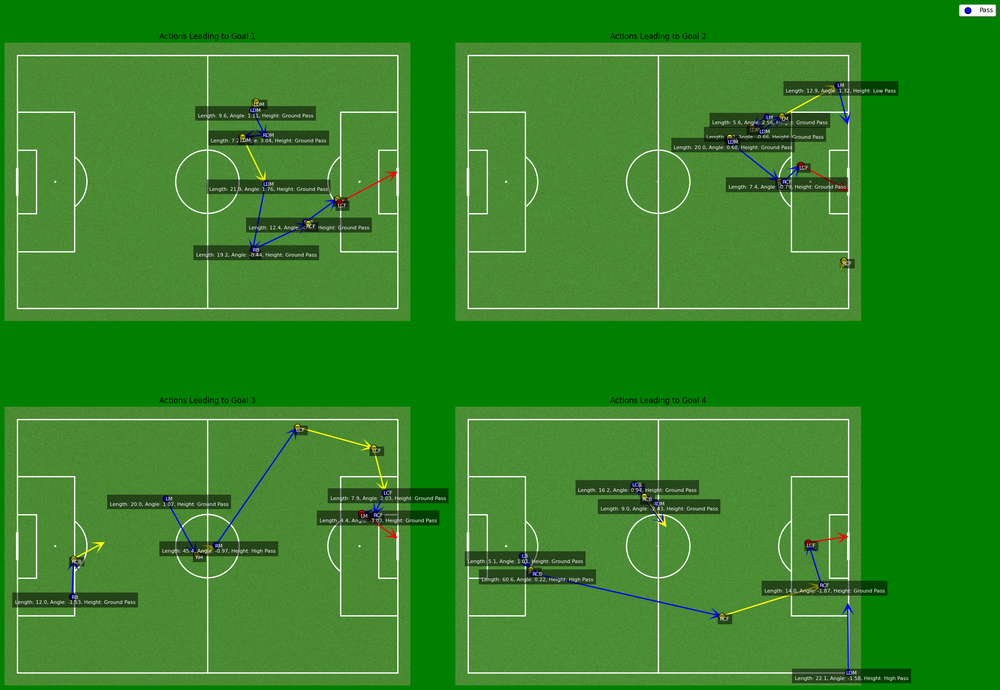

In [ ]:
role_abbreviations = {
    'Goalkeeper': 'GK',
    'Right Centre Forward': 'RCF',
    'Left Centre Forward': 'LCF',
    'Right Midfielder': 'RM',
    'Right Centre Back': 'RCB',
    'Left Defensive Midfielder': 'LDM',
    'Left Midfielder': 'LM',
    'Left Back': 'LB',
    'Right Defensive Midfielder': 'RDM',
    'Right Back': 'RB',
    'Left Centre Back': 'LCB'
}

# Filter for New York Red Bulls, excluding incomplete passes
df = df[(df['event_type'].isin(['Pass', 'Carry', 'Shot'])) & (df['pass_outcome_name'] != 'Incomplete')]

# Set up the pitch
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(20, 16), constrained_layout=True)
axs = axs.flatten()
fig.set_facecolor('green')

# Define colors for each event type
event_colors = {'Pass': 'blue', 'Carry': 'yellow', 'Shot': 'red'}

# Iterate over each goal action and plot the related actions
for i, ax in enumerate(axs):
    if i < len(goal_actions):
        pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
        pitch.draw(ax=ax)

        goal_action = goal_actions.iloc[i]
        goal_index = goal_action.name
        start_index = max(goal_index - 10, 0)
        actions = df.loc[start_index:goal_index]

        # Plot actions
        for _, action in actions.iterrows():
            x, y = action['location_x'], action['location_y']
            event_type = action['event_type']
            player_role = role_abbreviations.get(action['sb_position'], 'UNK')

            # Build annotation text
            text_label = f"{player_role}"
            if event_type == 'Pass':
                pass_info = []
                if pd.notna(action['pass_length']):
                    pass_info.append(f"Length: {action['pass_length']:.1f}")
                if pd.notna(action['pass_angle']):
                    pass_info.append(f"Angle: {action['pass_angle']:.2f}")
                if pd.notna(action['pass_height_name']):
                    pass_info.append(f"Height: {action['pass_height_name']}")
                text_label += "\n" + ", ".join(pass_info)

            # Plot starting point
            ax.scatter(x, y, color=event_colors[event_type], s=100, edgecolors='black', zorder=3, label=event_type if _ == start_index else "")

            # Plot arrows if there is an end location
            end_x = action.get(f'{event_type.lower()}_end_location_x')
            end_y = action.get(f'{event_type.lower()}_end_location_y')
            if pd.notna(end_x) and pd.notna(end_y):
                pitch.arrows(x, y, end_x, end_y, width=2, headwidth=10, headlength=10, color=event_colors[event_type], ax=ax, zorder=2)

            # Add annotation
            ax.text(x + 1, y + 1, text_label, color='white', ha='center', va='center', fontsize=8, bbox=dict(facecolor='black', alpha=0.5, edgecolor='none'))

        ax.set_title(f'Actions Leading to Goal {i + 1}')

# Add legend
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.05, 1), shadow=True)

plt.show()